<a href="https://colab.research.google.com/github/CeciliaKLLin/Basic-Machine-Learning/blob/master/dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breed Classification

Build a multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identify the breeds of dog given an image of a dog.

## 2. Data

The data downloaded from Kaggle: https://www.kaggle.com/c/dog-breed-identification/overview


## 3. Evaluation



## 4. Features

Information about the data:
* Images (Unstructed data)
* 120 breeds of dogs (120 different classes)


In [ ]:
#Unzip the uploaded data
#!unzip '/content/drive/My Drive/Dog_Breed_Deep_Learning/dog-breed-identification.zip' -d '/content/drive/My Drive/Dog_Breed_Deep_Learning'

Get the tools ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we're using GPU


In [1]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from IPython.display import Image
import os
import tensorflow as tf
import tensorflow_hub as hub
print('TensorFlow version:', tf.__version__)
print('TensorFlow Hub version:', hub.__version__)
from tensorflow import keras
from tensorflow.keras import layers
import datetime

# Check if GPU available
print('GPU availiable' if tf.config.list_physical_devices('GPU') else 'not available')

TensorFlow version: 2.3.0
TensorFlow Hub version: 0.9.0
GPU availiable


### Getting data ready (Turning to tensors)

Data has to be in numerical format. Turning images into Tensors(numerical representation)

In [29]:
import pandas as pd
labels_csv = pd.read_csv('/content/drive/My Drive/Dog_Breed_Deep_Learning/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,f662df0beaf91c254157863bf00ac62e,scottish_deerhound
freq,1,126


In [30]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


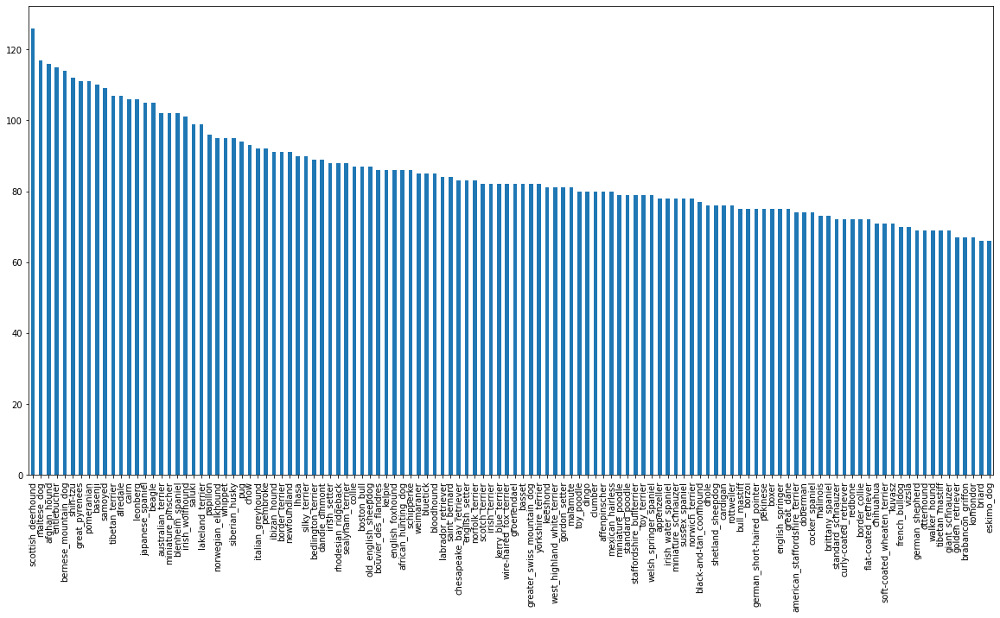

In [31]:
# How many images are there for each breed?
labels_csv['breed'].value_counts().plot.bar(figsize = (20,10))

In [32]:
labels_csv['breed'].value_counts().median()

82.0

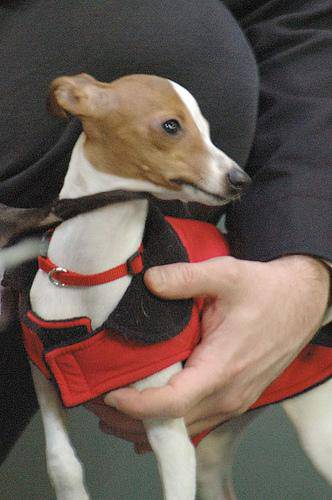

In [33]:
# view an image
from IPython.display import Image
Image('/content/drive/My Drive/Dog_Breed_Deep_Learning/train/8e4d2ac20aa4433988f8a0037fae8c31.jpg')

### Getting image and labels

In [34]:
# create pathnames from image ID's
filenames = ['/content/drive/My Drive/Dog_Breed_Deep_Learning/train/'+fname for fname in labels_csv['id']+'.jpg']
filenames[:10]

['/content/drive/My Drive/Dog_Breed_Deep_Learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [35]:
# check if number of filenames match the number of actual image files
import os
if len(os.listdir('/content/drive/My Drive/Dog_Breed_Deep_Learning/train/')) ==len(filenames):
  print('Match!')
else: 
  print('Not match! Please check!')

Match!


In [36]:
import numpy as np
# or labels = labels_csv['breed'].to_numpy()
labels = labels_csv['breed']
labels = np.array(labels) 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [37]:
len(labels)

10222

In [38]:
# check if number of filenames match the number of labels
if len(labels) ==len(filenames):
  print('Match!')
else: 
  print('Not match! Please check!')

Match!


In [39]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# turn a single label into an array of booleans
print(labels[1])
labels[1] == unique_breeds

dingo


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(boolean_labels)

10222

In [ ]:
# convert boolean array into integers
print(labels[0]) # the original label
print(np.where(unique_breeds) == labels[0]) # index where the label occurs in unique_breeds
print(boolean_labels[0].argmax()) # index where the label occur in boolean list
print(boolean_labels[0].astype(int)) # True = 1, where the label occur in list

boston_bull
False
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Create validation set
Since Kaggle only provides training and test set, we need to split the validation set from training set

In [ ]:
# Setup X & y
X = filenames
y = boolean_labels

In [ ]:
# set the number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [ ]:
# split the data into training and validation set
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES], test_size = 0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Image (turning images to tensors)

1. Take the image filepath as input
2. Use TensorFlow to read the file and save it to a variable
3. turn image to Tensors
4. Normalize the image (convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of 
6. return the modified image

In [ ]:
# convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# convert numpy array into Tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [2]:
# Define the image size
IMG_SIZE = 224

# functionfor preprocessing
def process_image(image_path, img_size = IMG_SIZE):
  """
  Take an image filepath and turn it into a Tensor
  """
  # read in the image file
  image = tf.io.read_file(image_path)

  # turn jpeg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels =3)

  # convert the colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

Trying to process more than 10000 images in one go
=> Might not fit into memory

Batch size = use aroun 32 images at a time (this can be adjusted)

To use TensorFlow effectively, the data in the form of Tensor tuples: '(image, label)'

In [3]:
# create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Take an image file path name and the associated label,
  processes the image and returns a tuple (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Create a function to turn all of the data (X & y) into batches.

In [4]:
# Define the batch size
BATCH_SIZE =32

# Create a function to turn data into batches
def create_data_batches(X , y=None, batch_size = BATCH_SIZE, valid_data = False, test_data= False):
  """
  Create batches of data out of image(X) and label (y) pairs.
  Shuffle the data if it is training data but doesn't shuffle if it is validation data.
  Also, test data (no labels) are accepted as input.
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches!')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches!')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else: 
    print('Creating training data batches!')
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # shuffle pathnames and labels before mapping image processor function is faster
    data = data.shuffle(buffer_size = len(X))
    # create (image, label) tuples (also turn image path into a preprocessed image)
    # turn the training data into batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch




In [ ]:
train_data = create_data_batches(X_train, y_train)
train_data.element_spec

Creating training data batches!


(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
val_data = create_data_batches(X_val, y_val, valid_data=True)
val_data.element_spec

Creating validation data batches!


(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Visualizing the Data Batches

In [ ]:
import matplotlib.pyplot as plt
# create a function for viewing images in a data batch
def show_20_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10, 10))
  # loop through 20 (for displaying 20 images)
  for i in range(20):
    ax = plt.subplot(5, 4, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# unbatch the batch 
# because the train data is in the format of a batch, we need to turn it into an iterator by '.as_numpy_iterator()'
# 'next()' => we can grabe the first batch of the train_data
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

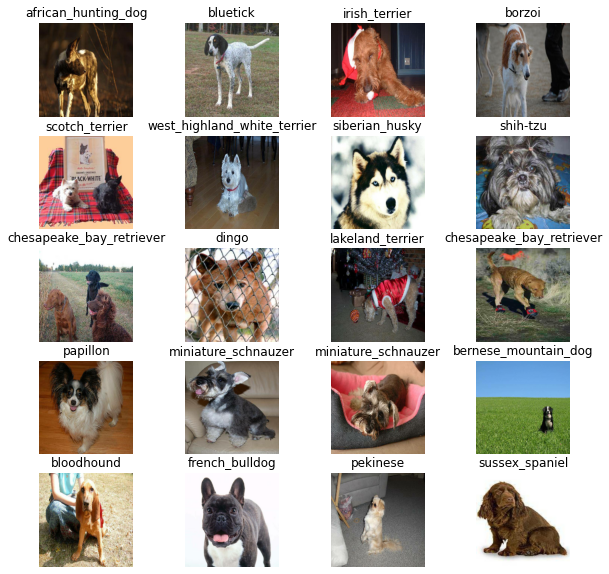

In [ ]:
# visualize the data in a training batch
show_20_images(train_images, train_labels)

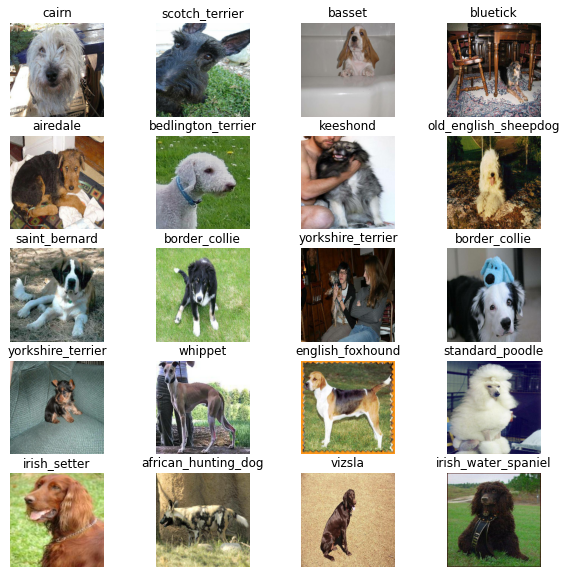

In [ ]:
# visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_20_images(val_images, val_labels)

## Building the model

Before we build a model, things to define:
* input shape (image shape, in the form of Tensors)
* output shape (image labels, in the form of Tensors)
* the URL of the model we want to use from TensorsFlow Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4



In [ ]:
# setup input shape 
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE,3]

# setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Inputs, outputs, model are ready.
Put them together into a Keras deep learning model!

Create a function, include:
* take the input shape, output shape and the model as parameters
* define the layers in a Keras model in Sequential model (linear)
* compiles the model (how it should be evaluated and improved)
* build the model (tell the model about the input shape)
* Return the model

All steps from https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

#create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:' ,MODEL_URL)

  # setup model layers
  model = keras.Sequential([
                            hub.KerasLayer(MODEL_URL), # Layer 1(input layers)
                            layers.Dense(units = OUTPUT_SHAPE, activation ='softmax') # Layer 2(Output layer)
                            
  ])

  # Compile the model 
  model.compile(
      loss = keras.losses.CategoricalCrossentropy(), 
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )
  # loss: measures how well the model is guessing. the higher the loss the worse the prediction
  # optimizer: 

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

callbacks: helper functions, can be used during training to do things (save the progress, check the progress or stop training early if a model stops improving etx)

Two Callbacks will be created:
* one for TensorBoard
* one for Early Stopping



#### TensorBoard
https://www.tensorflow.org/tensorboard/get_started
* setup:
1. Load the TensorBoard notebook Extension
2. Create a TensorBoard callback (able to save logs to a directory and pass it to the model 'fit() function)
3. Visualize the model training logs with the '%tensorboard' magic function (do it after the model training)


In [ ]:
#TensorBoard CallBack

# 1. Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# we want to track each experiment
import datetime # we can access the current date and time

# 2. create a function to build a TensorBoard callback
def create_tensorboard_callback():
   # create a log directory for storing TensorBoard logs
   logdir = os.path.join('/content/drive/My Drive/Dog_Breed_Deep_Learning/logs',
                         # the log get tracked whenever we run the experiment
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
   return keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback
* stop the model from overfitting
* stop the training if a certain evaluation metrics stop improve

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# create Early stopping callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training a model (on a subset of images)
first model: only training on 1000 images, to test the model

*epochs: the number of passes of the entire training dataset the machine learning algorithm has completed.

Function 'train_model()':
* Create a model: create_model()
* Setup TensorBoard callback: create_tensorboard_callback()
* call 'fit()' on model passing it the training data, validation data, number of epochs(NUM_EPOCHS) and the callback we want to use
* Return model 

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
print('GPU available') if tf.config.list_physical_devices('GPU') else print('not available')

GPU available


In [ ]:
# create a function which trains a model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard_callback = create_tensorboard_callback()

  # fit the model to the data
  model.fit(x=train_data, 
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            callbacks=[tensorboard_callback,early_stopping])


  # return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.9647 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 364s 15s/step - loss: 4.7018 - accuracy: 0.1088 - val_loss: 3.5985 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 162ms/step - loss: 1.7481 - accuracy: 0.6438 - val_loss: 2.3305 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 156ms/step - loss: 0.6193 - accuracy: 0.9187 - val_loss: 1.8352 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 155ms/step - loss: 0.2720 - accuracy: 0.9875 - val_loss: 1.6226 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1540 - accuracy: 0.9950 - val_loss: 1.5317 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 4s 156ms/step - loss: 0.1059 - accuracy: 1.0000 - val_loss: 1.4900 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================] - 4s 155ms/step - loss: 0.0793 - accuracy: 1.0000 - val_loss: 1.4575 - val_accuracy: 0.6100
Epoch 8/100

## Evaluating the model

### Check the TensorBoard logs

The magic function '%tensorboard' will access the logs and visualize the contents.

In [ ]:
# check the TensorBoard logs
%tensorboard --logdir drive/My\ Drive/Dog_Breed_Deep_Learning/logs
# since there are spaces in the filename, need to add \ before the spaces

<IPython.core.display.Javascript object>

#### Making and evaluation predictions using a trained model


In [ ]:
# make prediction on the validation data (not use to train on)
predictions = model.predict(val_data, verbose =1)
predictions

7/7 [==============================] - 1s 105ms/step


array([[7.97540823e-04, 1.32903457e-04, 1.57728570e-03, ...,
        3.04495363e-04, 4.69292718e-05, 3.44789587e-03],
       [2.85428576e-03, 2.22856819e-04, 9.70332697e-03, ...,
        3.78066907e-03, 2.62361998e-03, 6.08831237e-04],
       [1.02605212e-04, 1.40875520e-04, 6.43396925e-05, ...,
        1.87132173e-04, 9.53262905e-04, 5.36929350e-04],
       ...,
       [1.00066514e-04, 6.62266539e-05, 1.32039249e-05, ...,
        3.43855681e-05, 5.20410722e-05, 3.92727903e-04],
       [1.15544372e-03, 2.27620942e-04, 6.45065666e-05, ...,
        3.07512411e-04, 4.10845932e-05, 2.27920501e-03],
       [2.03885822e-04, 6.17390469e-06, 8.37082160e-04, ...,
        4.11277986e-04, 7.57027941e-04, 3.73998228e-05]], dtype=float32)

In [ ]:
# first prediction
index = 0
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[7.97540823e-04 1.32903457e-04 1.57728570e-03 5.69242286e-04
 3.43071064e-04 1.52479071e-04 3.03648692e-02 1.69812251e-04
 1.87596190e-04 1.81009760e-04 5.31112601e-04 5.85894915e-04
 3.36956611e-04 7.90465056e-05 4.46481572e-05 2.40160691e-04
 2.00239556e-05 2.41288245e-01 2.70049641e-05 5.44981267e-05
 8.00828857e-04 2.53783626e-04 1.15051307e-05 3.24487593e-03
 5.79902699e-05 6.06823538e-04 1.26134127e-01 5.20358117e-05
 3.39566992e-04 9.10083123e-04 4.46126614e-05 7.71994982e-03
 1.42876222e-03 2.49812138e-06 2.59014021e-04 5.89384884e-02
 8.75385667e-05 1.98474954e-04 2.26632565e-05 6.42277737e-05
 4.92671970e-04 1.29040796e-04 2.11466191e-04 1.92054344e-04
 3.13786950e-05 1.21359983e-04 1.58472358e-05 4.79299597e-05
 6.64643667e-05 2.00937327e-04 5.19465102e-05 2.63079455e-05
 1.20047526e-03 4.59971816e-05 3.17082246e-04 6.96794450e-05
 2.95577105e-04 3.86086735e-03 2.27188386e-04 1.31094843e-01
 6.22711144e-04 4.10432913e-05 1.42867223e-03 8.90360207e-06
 1.39008393e-03 3.752180

In [ ]:
# prediction probabilities are also known as confidence levels.

# create function which turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# example
pred_label = get_pred_label(predictions[4])
pred_label

'airedale'

In [ ]:
# Since the validation data is in a batch, need to unbatchify it to make prediction on the validation image
# make comparison between predictions to the true label


In [ ]:
def unbatchify(data):
  """
  Take a batched dataset of (image, label) Tensors and returns separated arrays of images and labels
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels


# unbatchify the dataset
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels[0])

'affenpinscher'

### Visualize Model Predictions
we got:
* Prediction labels
* validation labels(true label)
* validation images

function:
* take an array of prediction probabilities, true labels and images and an integer.
* convert the prediction probabilities to a prediction label.
* plot the predicted label, prediction probability, the true label and the image in a single plot.


In [ ]:
# create a function to visualize the model prediction
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, true label and image for sample n
  """
  
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)


  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the title color depending on if the prediction is correct or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # change the title to be predicted label, probability of prediction and the true label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)
  



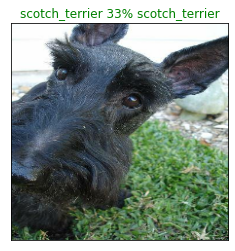

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images = val_images)

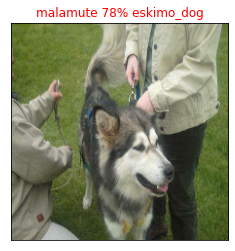

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images = val_images,
          n=34)

In [ ]:
predictions[0].argsort()

array([ 33,  63,  22,  46,  16,  38, 112, 115,  92,  51,  18,  44, 108,
        61,  30,  14,  53, 118,  47,  66,  50,  27,  19,  84,  24,  39,
        48,  55,  13,  94,  36,  69,  71,  45,  86, 107,  41,   1,  99,
         5,  89,   7,   9,   8,  43,  37, 105,  49,  42,  98, 101,  58,
        15,  21,  34,  82,  56, 117,  54,  12,  28,   4, 110, 113,  88,
        40,  10,  87, 114,  67,   3,  11,  25,  60,  91,  72,   0,  20,
       104,  78,  29,  75, 111,  52,  85, 116,  80,  64,  62,  32,   2,
        95,  90,  96,  93,  23, 119,  57, 106,  83,  81,  31,  68, 100,
        76,  73,  74,  77, 109, 102,   6,  65,  79,  70,  97, 103,  35,
        26,  59,  17])

In [ ]:
# the top 10 prediction confidence indexes (in decending order)
predictions[0].argsort()[-10:][::-1]

array([ 17,  59,  26,  35, 103,  97,  70,  79,  65,   6])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]], predictions[0].max()

(array([0.24128824, 0.13109484, 0.12613413, 0.05893849, 0.05327705,
        0.0473071 , 0.04025248, 0.03964836, 0.03752181, 0.03036487],
       dtype=float32), 0.24128824)

the function to plot top 10 predictions:
* take the input of prediction probabilities array and a ground truth array and an integer
* find the prediction label using 'get_pred_label()'
* find the top 10:
  * prediction confidence indexes
  * prediction confidence values
  * prediction labels
* plot the top 10 prediction probability values and labels
* coloring the true label green

In [ ]:
# plot top 10 predictions of the model
def plot_pred_prob(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidence along with the true label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = predictions[n].argsort()[-10:][::-1]

  # find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  
  # change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels ==true_label)].set_color('green')
  else:
    pass
  


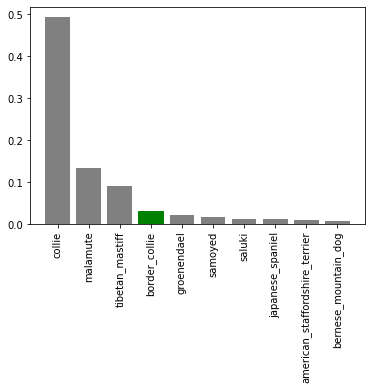

In [ ]:
plot_pred_prob(prediction_probabilities=predictions,
               labels= val_labels,
               n =9)

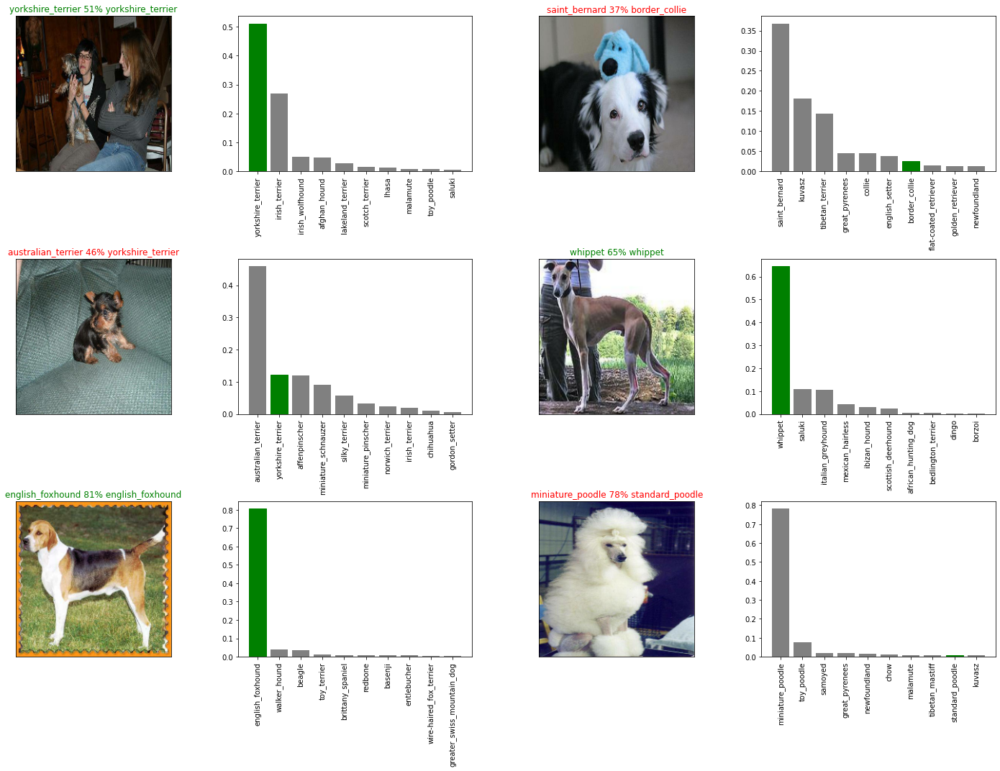

In [ ]:
# check some predictions and their differet values
i_multiplier = 10 # use to indicate the index (n) inside the functions
num_rows = 3
num_cols = 2
num_images = num_rows* num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images= val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_prob(prediction_probabilities=predictions,
                 labels= val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Save and Load the model

In [ ]:
# create a function to save a model
def save_model(model, suffix =None):
  """
  Save a given model in a model directory and appends a suffix (sting)
  """
  # create a model directory pathname with current time
  modeldir = os.path.join('drive/My Drive/Dog_Breed_Deep_Learning/Model',
                          datetime.datetime.now().strftime('%Y&m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path


In [6]:
# create a function to load the trained model
def load_model(model_path):
  """
  load a saved model from a specified path.
  """
  print(f'Loading model from: {model_path}...')
  # since we use tensorflow hub, we need to make some special arrangement in custom_objects
  model = keras.models.load_model(model_path,
                                  custom_objects = {'KerasLayer': hub.KerasLayer})
  return model

In [ ]:
# save the model
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving model to: drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-13201600262407-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-13201600262407-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load the model
loaded_1000images_model = load_model('drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-06351600238103-1000-images-mobilenetv2-Adam.h5')

Loading model from: drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-06351600238103-1000-images-mobilenetv2-Adam.h5...


In [ ]:
#evaluate the pre_saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 1.4407 - accuracy: 0.6050


[1.440697193145752, 0.6050000190734863]

In [ ]:
# evaluate the loaded model
loaded_1000images_model.evaluate(val_data)

7/7 [==============================] - 1s 101ms/step - loss: 1.2985 - accuracy: 0.6450


[1.2985174655914307, 0.6449999809265137]

## Training the model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# create a data batch with the full data
full_data = create_data_batches(X,y)
full_data

Creating training data batches!


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
len(full_data)

320

In [ ]:
# create model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# create full model callback
full_model_tensorboard = create_tensorboard_callback()
# no validation set when training on all data, we can't monitor the valiadtion accuracy 
full_model_earlystopping = keras.callbacks.EarlyStopping(monitor='accuracy',
                                                         patience =3)

In [ ]:
# fit the full model to the full data
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 4494s 14s/step - loss: 1.3420 - accuracy: 0.6719
Epoch 2/100
320/320 [==============================] - 41s 127ms/step - loss: 0.4055 - accuracy: 0.8798
Epoch 3/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2385 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1553 - accuracy: 0.9636
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1049 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0800 - accuracy: 0.9853
Epoch 7/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0576 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0474 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0370 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 40s 126m

In [ ]:
# save the model immediately after the training
save_model(full_model,suffix = 'full-image-set-mobilenetv2-Adam')

Saving model to: drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-14531600268036-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-14531600268036-full-image-set-mobilenetv2-Adam.h5'

In [7]:
loaded_full_model = load_model('drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-14531600268036-full-image-set-mobilenetv2-Adam.h5')

Loading model from: drive/My Drive/Dog_Breed_Deep_Learning/Model/2020&m16-14531600268036-full-image-set-mobilenetv2-Adam.h5...


## Make Prediction on Test data
To make prediction on the test data, we need to get the data into the same format as the training data.
##### Preprocessing Image & Turning data into batches
* 'create_data_batches()': including preprocess images

1. Get the test images filenames
2. convert the filenames into test data batches using 'create_data_batches', test_data=True


In [11]:
# load test image filename
test_path = '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/My Drive/Dog_Breed_Deep_Learning/test/eef2fd5db98424ae214e176a910e9e3b.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/ef154d61fb8fd0852877c86dbfc5afc6.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/ece4530999e8c3ec85d2a86d33f07e37.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/f18975efa3a5f8f75f46dd0b5485cbee.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/f320aa2676156d3760a409e1b333474d.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/f18e43d6627bf395c2e3aae518067004.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/f10241d199251db359961e814733efc5.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/f050fe5feb0a81de5da10a5e806e739a.jpg',
 '/content/drive/My Drive/Dog_Breed_Deep_Learning/test/e995cbf5f2c4da27a1e56966c70de380.jpg']

In [12]:
len(test_filenames)

10356

In [13]:
# create test data batches
test_data = create_data_batches(test_filenames, test_data = True)
test_data

Creating test data batches!


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [14]:
# call predict' will take a long time because of the large amount of images
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 5688s 18s/step


In [17]:
# save predictions (Numpy array) to csv file (for access later)
np.savetxt('drive/My Drive/Dog_Breed_Deep_Learning/pred_array.csv', test_predictions, delimiter = ',')

In [18]:
# load the predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/My Drive/Dog_Breed_Deep_Learning/pred_array.csv', delimiter = ',')

In [19]:
test_predictions[:10]

array([[5.56609703e-10, 3.74915876e-10, 6.31714082e-12, ...,
        6.39715704e-15, 7.99884551e-12, 9.40021838e-09],
       [3.87963606e-10, 6.96834626e-13, 2.42101803e-13, ...,
        4.62892020e-14, 3.38900075e-10, 2.40366704e-09],
       [1.44020603e-11, 5.70089176e-09, 6.99588831e-10, ...,
        1.39439703e-06, 2.99335504e-03, 1.30641842e-09],
       ...,
       [5.58079734e-08, 2.60166444e-09, 3.08601322e-09, ...,
        3.10236081e-09, 5.50396976e-07, 4.27074337e-06],
       [5.68434605e-11, 2.50323590e-12, 1.32028245e-13, ...,
        6.64880217e-12, 4.42716068e-14, 1.05691064e-12],
       [5.23256494e-10, 1.50329436e-11, 2.91265900e-11, ...,
        3.80392231e-14, 2.34367636e-10, 4.51000404e-10]])

## Prepare submission to Kaggle

In [47]:
pred_test = pd.DataFrame(columns = ['id'] + list(unique_breeds))
pred_test

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [48]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['eef2fd5db98424ae214e176a910e9e3b',
 'ef154d61fb8fd0852877c86dbfc5afc6',
 'ece4530999e8c3ec85d2a86d33f07e37',
 'f18975efa3a5f8f75f46dd0b5485cbee',
 'f320aa2676156d3760a409e1b333474d',
 'e8763575a23f1e1a86788b82bd105f07',
 'f18e43d6627bf395c2e3aae518067004',
 'f10241d199251db359961e814733efc5',
 'f050fe5feb0a81de5da10a5e806e739a',
 'e995cbf5f2c4da27a1e56966c70de380',
 'ef1710d5cb79a5e0b46f7b9a101a25b4',
 'efdf443fb4a6ad5964c18d6676f36652',
 'f1979a55bddde4fda0282da796460f80',
 'f00b35c8f1a052d4989f17134532efb4',
 'ee76bbe553722f075e334dc29f3173a9',
 'ea23e5341ec5fc3f798ae527a4659d81',
 'ebf3e1d5583ceff0a51a8c6a750b367b',
 'f16fd3afeb123e25cfe3e712faee8aa5',
 'e90bd6aa38e304f67db74f757df9a834',
 'fda5707e5736ef6deceb5e356f36355c',
 'ffe2315cf566e039516f5a4a5e52ff1b',
 'fab7c38522b8bb9e71626f6f1a384d8c',
 'fa770328b53a68589a12b6f059099ee8',
 'fe9ffddcf66c68e9bb38edcb0c6f44e1',
 'fd219ab54b33aa99a68797431a1b8e07',
 'f77793be1597dd1ea50b22532b38bd23',
 'faaf9144e28a76de76ab05c59354f0fb',
 

In [49]:
pred_test['id'] = test_ids
pred_test.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eef2fd5db98424ae214e176a910e9e3b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ef154d61fb8fd0852877c86dbfc5afc6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ece4530999e8c3ec85d2a86d33f07e37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f18975efa3a5f8f75f46dd0b5485cbee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f320aa2676156d3760a409e1b333474d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
pred_test[list(unique_breeds)] = test_predictions
pred_test.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eef2fd5db98424ae214e176a910e9e3b,5.5661e-10,3.74916e-10,6.31714e-12,1.81417e-15,1.27255e-12,1.7245e-12,2.45559e-15,1.39871e-12,1.93334e-10,2.27281e-09,5.0233e-14,9.1987e-12,3.61459e-13,8.01659e-09,2.7633e-13,2.52959e-10,2.57592e-10,2.49451e-10,1.41505e-13,2.85789e-14,2.99604e-14,3.34264e-11,1.07917e-08,3.09105e-07,8.93806e-12,1.01602e-09,6.14205e-11,1.43307e-13,1.76489e-13,1.11971e-11,2.56904e-13,4.37878e-07,5.98817e-10,6.88055e-16,1.2715e-16,3.70401e-11,5.64024e-16,1.87644e-15,6.3633e-16,...,6.92989e-14,1.45202e-15,4.11494e-13,1.11589e-11,4.65416e-07,1.46079e-05,2.19395e-16,6.02447e-10,2.05081e-07,7.97358e-14,6.68364e-12,2.89901e-14,5.98882e-10,5.1661e-09,2.60968e-14,9.07881e-15,1.86268e-13,8.06e-15,4.88355e-08,1.37057e-12,0.986714,3.80209e-10,9.51523e-06,1.04003e-10,5.00246e-12,2.62385e-14,7.48176e-11,3.29323e-10,4.15917e-13,1.72747e-08,2.49616e-09,9.55185e-11,7.04552e-12,9.20628e-16,7.56692e-12,8.08173e-13,2.0551e-12,6.39716e-15,7.99885e-12,9.40022e-09
1,ef154d61fb8fd0852877c86dbfc5afc6,3.87964e-10,6.96835e-13,2.42102e-13,2.4002e-12,5.3767e-13,1.1435e-11,3.81562e-12,1.89341e-12,2.29501e-12,2.01732e-11,7.54595e-13,2.28054e-08,4.76832e-11,0.999994,1.99096e-12,6.83677e-13,2.56349e-12,8.37368e-13,6.75403e-13,9.77707e-11,2.11043e-12,1.55771e-11,3.501e-10,3.90351e-13,1.45851e-08,1.73318e-10,3.23476e-11,8.37363e-14,1.17774e-12,2.36964e-10,2.16854e-11,1.72862e-09,1.49996e-08,1.52021e-10,2.444e-13,3.86489e-13,3.55195e-11,3.78591e-13,5.35273e-13,...,3.06231e-12,1.01412e-11,8.27513e-13,5.75101e-10,8.14059e-09,8.24508e-12,5.79848e-12,3.20551e-10,2.38339e-13,4.773e-14,1.3033e-12,4.53385e-14,8.16998e-11,5.08903e-13,1.25368e-11,1.30876e-10,7.17663e-13,4.56073e-13,3.30723e-11,1.78799e-10,6.55192e-12,1.18063e-10,5.98862e-11,3.42676e-12,5.31676e-11,1.52158e-10,9.11093e-10,1.25803e-07,1.94655e-12,4.45893e-11,4.98776e-12,3.73409e-13,3.66231e-11,8.93873e-13,8.90079e-13,6.36934e-07,2.02493e-11,4.62892e-14,3.389e-10,2.40367e-09
2,ece4530999e8c3ec85d2a86d33f07e37,1.44021e-11,5.70089e-09,6.99589e-10,1.68711e-05,1.22555e-05,4.17931e-07,0.000798422,0.000535615,0.000181298,0.976496,7.75261e-10,3.88821e-12,5.39286e-07,1.96115e-11,2.87784e-06,2.21773e-06,7.01233e-08,2.38689e-07,1.64655e-10,5.53434e-09,1.21843e-12,3.02734e-09,2.90314e-09,1.12855e-09,1.04305e-07,1.29409e-09,9.12907e-11,1.09248e-05,1.65779e-09,7.8298e-08,1.68957e-09,2.03941e-09,6.67159e-09,1.95414e-06,1.8692e-09,1.15095e-07,8.0944e-08,4.21683e-07,2.54327e-07,...,2.84405e-07,7.35393e-08,1.1045e-08,5.31016e-08,7.92859e-10,4.87923e-10,2.10929e-06,6.16789e-12,8.18618e-12,3.50182e-07,1.24615e-08,5.02654e-09,3.83012e-11,4.02639e-07,2.32125e-10,2.18587e-09,1.23166e-11,2.61832e-11,9.49551e-10,8.1587e-08,9.44426e-11,1.37142e-07,1.06722e-08,3.72502e-12,1.1012e-07,1.9973e-06,1.597e-09,3.95985e-11,4.16969e-10,1.70114e-08,1.18187e-09,3.88787e-08,2.15156e-07,0.0186108,4.56051e-09,2.11398e-07,1.95137e-08,1.3944e-06

In [52]:
# save the predictions dataframe to csv
pred_test.to_csv('drive/My Drive/Dog_Breed_Deep_Learning/full-image-prediction-mobilenetV2.csv',
                 index = False)